

The code below is working on a dataset of DiscoBall consist of 50 images. 40 for training and 10 for test.
First we use annotation file in order to make mask images and using them for training model.

The goal of this assignment is to fine-tune a pre-trained  Image Segmentation model for the Disco Ball dataset.

technique for avoiding underfitting / overfitting Early Stopping is used.


In [ ]:
# Import the required libraries
import json
import numpy as np
import cv2
import matplotlib.pyplot as plt
from pycocotools import mask as coco_mask
import torchvision
import torch
import torch.utils.data
import os
from PIL import Image
from torchvision.models.detection.mask_rcnn import MaskRCNN
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.transforms import transforms
!pip3 install wget
import wget


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
if os.path.isdir('data')==False:
  !wget https://raw.githubusercontent.com/peymanlee/Image-Segmentation-model-for-DiscoBall/main/DiscoCircle.zip --no-check-certificate

--2023-05-19 20:18:56--  https://raw.githubusercontent.com/peymanlee/assignment2/main/DiscoCircle.zip
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 14077827 (13M) [application/zip]
Saving to: ‘DiscoCircle.zip’

DiscoCircle.zip     100%[===================>]  13.42M  --.-KB/s    in 0.05s   

2023-05-19 20:18:57 (284 MB/s) - ‘DiscoCircle.zip’ saved [14077827/14077827]



In [ ]:
if os.path.isdir('data')==False:
  !unzip DiscoCircle.zip -d data

Archive:  DiscoCircle.zip
  inflating: data/Annotation/Annotation.json  
  inflating: data/DiscoBall/img01.jpg  
  inflating: data/DiscoBall/img02.jpg  
  inflating: data/DiscoBall/img03.jpg  
  inflating: data/DiscoBall/img04.jpg  
  inflating: data/DiscoBall/img05.jpg  
  inflating: data/DiscoBall/img06.jpg  
  inflating: data/DiscoBall/img07.jpg  
  inflating: data/DiscoBall/img08.jpg  
  inflating: data/DiscoBall/img09.jpg  
  inflating: data/DiscoBall/img10.jpg  
  inflating: data/DiscoBall/img11.jpg  
  inflating: data/DiscoBall/img12.jpg  
  inflating: data/DiscoBall/img13.jpg  
  inflating: data/DiscoBall/img14.jpg  
  inflating: data/DiscoBall/img15.jpg  
  inflating: data/DiscoBall/img16.jpg  
  inflating: data/DiscoBall/img17.jpg  
  inflating: data/DiscoBall/img18.jpg  
  inflating: data/DiscoBall/img19.jpg  
  inflating: data/DiscoBall/img20.jpg  
  inflating: data/DiscoBall/img21.jpg  
  inflating: data/DiscoBall/img22.jpg  
  inflating: data/DiscoBall/img23.jpg  
  infla

In [ ]:
device = torch.device('cuda:0') if torch.cuda.is_available() else torch.device('cpu')
print(f'device: {device}')

device: cuda:0


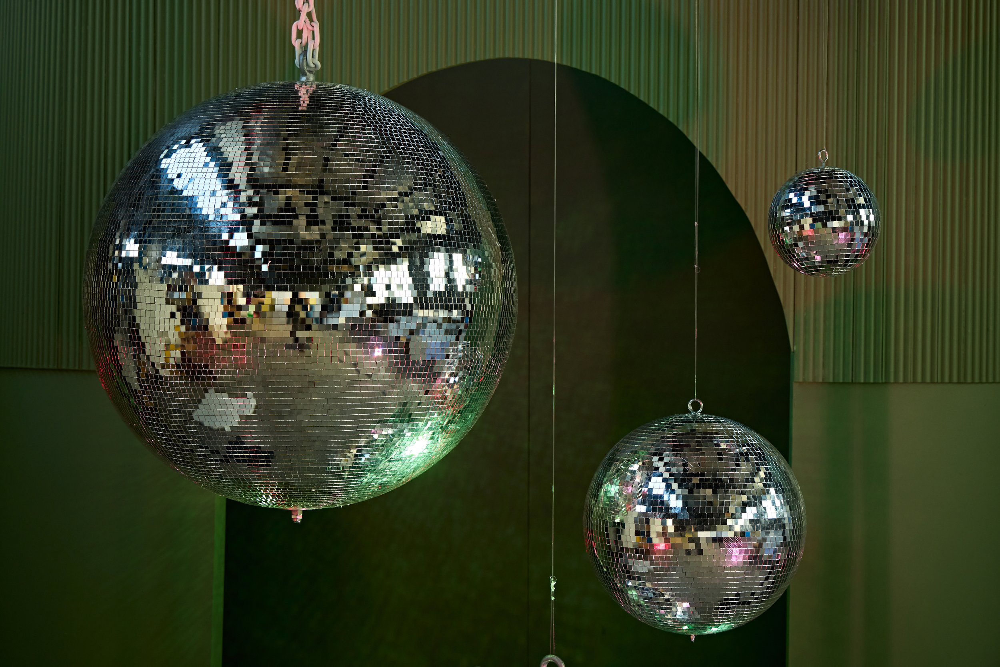

In [ ]:
Image.open('data/DiscoBall/img49.jpg')

In [ ]:
import cv2
import numpy as np
import json
image_dir = "data/DiscoBall"
Mask_dir = 'data/OutMask'
os.makedirs(Mask_dir, exist_ok=True)

# Load the annotation file
with open('data/Annotation/Annotation.json') as f:
    data = json.load(f)

# Process each image in the annotation file
for image_id in data['_via_image_id_list']:
    image_data = data['_via_img_metadata'][image_id]
    filename = image_data['filename']
    regions = image_data['regions']

    # Create mask image
    # mask_image = create_mask_image(filename, regions)
    image_path = os.path.join(image_dir, filename)
    img = cv2.imread(image_path)
    mask = np.zeros_like(img[:, :, 0])

    i = 1
    for region in regions:
        shape_attributes = region['shape_attributes']
        if shape_attributes['name'] == 'circle':
            cx = shape_attributes['cx']
            cy = shape_attributes['cy']
            radius = int(shape_attributes['r'])  # Convert radius to integer
            cv2.circle(mask, (cx, cy), radius, i, -1)
            i = i + 1

    # Save mask image
    mask_filename = filename.replace('.jpg', '.png')
    output_path = os.path.join(Mask_dir, mask_filename)
    cv2.imwrite(output_path, mask)


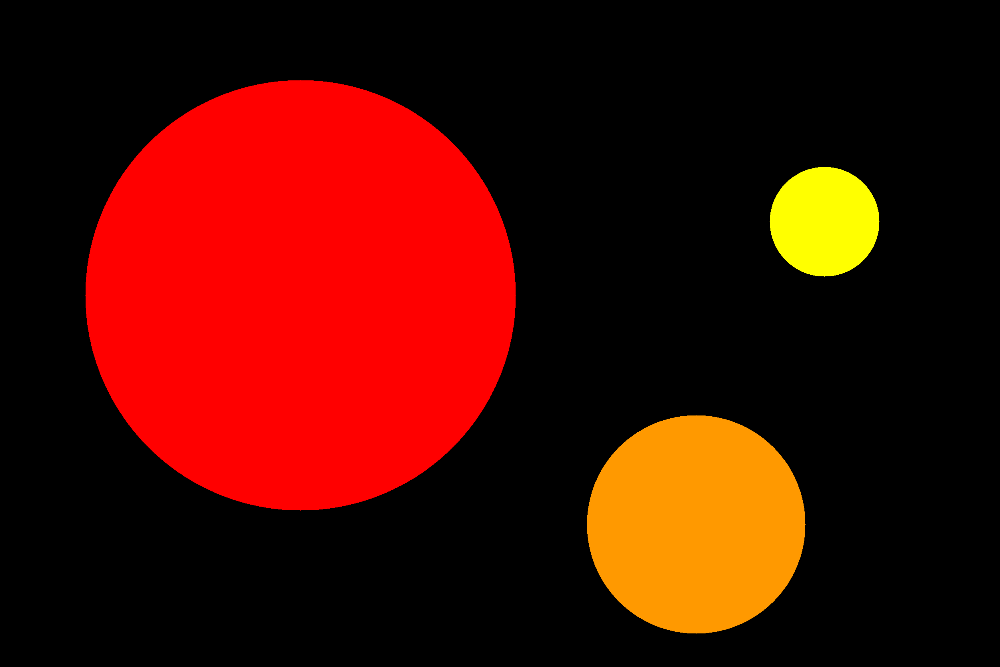

In [ ]:
mask = Image.open('data/OutMask/img49.png').convert("L")

mask.putpalette([
    0, 0, 0, # black background
    255, 0, 0, # index 1 is red
    255, 255, 0, # index 2 is yellow
    255, 153, 0, # index 3 is orange
])
mask

In [ ]:
class DiscoBallDataset(torch.utils.data.Dataset):
    def __init__(self, root, transforms=None):
        self.root = root
        self.transforms = transforms
        # load all image files, sorting them to
        # ensure that they are aligned
        self.imgs = list(sorted(os.listdir(os.path.join(root, "DiscoBall"))))
        self.masks = list(sorted(os.listdir(os.path.join(root, "OutMask"))))

    def __getitem__(self, idx):
        # load images ad masks
        img_path = os.path.join(self.root, "DiscoBall", self.imgs[idx])
        mask_path = os.path.join(self.root, "OutMask", self.masks[idx])
        img = Image.open(img_path).convert("RGB")

        mask = Image.open(mask_path)

        mask = np.array(mask)
        # instances are encoded as different colors
        obj_ids = np.unique(mask)
        # first id is the background, so remove it
        obj_ids = obj_ids[1:]

        masks = mask == obj_ids[:, None, None]

        # get bounding box coordinates for each mask
        num_objs = len(obj_ids)
        boxes = []
        for i in range(num_objs):
            pos = np.where(masks[i])
            xmin = np.min(pos[1])
            xmax = np.max(pos[1])
            ymin = np.min(pos[0])
            ymax = np.max(pos[0])
            boxes.append([xmin, ymin, xmax, ymax])

        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        # there is only one class
        labels = torch.ones((num_objs,), dtype=torch.int64)
        masks = torch.as_tensor(masks, dtype=torch.uint8)

        image_id = torch.tensor([idx])
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])
        # suppose all instances are not crowd
        iscrowd = torch.zeros((num_objs,), dtype=torch.int64)

        target = {}
        target["boxes"] = boxes # the coordinates of the N bounding boxes in [x0, y0, x1, y1] format, ranging from 0 to W and 0 to H
        target["labels"] = labels # the label for each bounding box
        target["masks"] = masks # The segmentation masks for each one of the objects
        target["image_id"] = image_id # an image identifier. It should be unique between all the images in the dataset, and is used during evaluation
        target["area"] = area # The area of the bounding box. This is used during evaluation with the COCO metric, to separate the metric scores between small, medium and large boxes.
        target["iscrowd"] = iscrowd #  instances with iscrowd=True will be ignored during evaluation.

        if self.transforms is not None:
            img, target = self.transforms(img, target)

        return img, target

    def __len__(self):
        return len(self.imgs)

In [ ]:
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.mask_rcnn import MaskRCNNPredictor

# version dependent: pretrained=True or weights='DEFAULT'
def build_model(num_classes):
    # load an instance segmentation model pre-trained on COCO

    model = torchvision.models.detection.maskrcnn_resnet50_fpn(pretrained=True)

    # get the number of input features for the classifier
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    # replace the pre-trained head with a new one
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)


    return model

In [ ]:
if os.path.isdir('vision')==False:
    !git clone https://github.com/pytorch/vision.git
    %cd vision
    !git checkout v0.8.2
    !cp references/detection/transforms.py ../
    !git checkout main
    !cp references/detection/utils.py ../
    !cp references/detection/coco_eval.py ../
    !cp references/detection/engine.py ../
    !cp references/detection/coco_utils.py ../
    %cd ../
    cwd = os.getcwd()
    print(cwd)


Cloning into 'vision'...
remote: Enumerating objects: 326422, done.
remote: Counting objects: 100% (326422/326422), done.
remote: Compressing objects: 100% (25541/25541), done.
remote: Total 326422 (delta 300252), reused 325308 (delta 299254), pack-reused 0
Receiving objects: 100% (326422/326422), 661.04 MiB | 22.70 MiB/s, done.
Resolving deltas: 100% (300252/300252), done.
/content/vision
Note: switching to 'v0.8.2'.

You are in 'detached HEAD' state. You can look around, make experimental
changes and commit them, and you can discard any commits you make in this
state without impacting any branches by switching back to a branch.

If you want to create a new branch to retain commits you create, you may
do so (now or later) by using -c with the switch command. Example:

  git switch -c <new-branch-name>

Or undo this operation with:

  git switch -

Turn off this advice by setting config variable advice.detachedHead to false

HEAD is now at 2f40a483d7 [v0.8.X] .circleci: Add Python 3.9 

In [ ]:
import math
import sys
import time

import torch
import torchvision.models.detection.mask_rcnn
import utils
from coco_eval import CocoEvaluator
from coco_utils import get_coco_api_from_dataset

train_loss_h = []
acc_loss_h = []

def train_one_epoch(model, optimizer, data_loader, device, epoch, print_freq, scaler=None, early_stop_patience=None):
    model.train()
    metric_logger = utils.MetricLogger(delimiter="  ")
    metric_logger.add_meter("lr", utils.SmoothedValue(window_size=1, fmt="{value:.6f}"))
    header = f"Epoch: [{epoch}]"

    lr_scheduler = None
    if epoch == 0:
        warmup_factor = 1.0 / 1000
        warmup_iters = min(1000, len(data_loader) - 1)

        lr_scheduler = torch.optim.lr_scheduler.LinearLR(
            optimizer, start_factor=warmup_factor, total_iters=warmup_iters
        )
    best_loss = math.inf
    epochs_without_improvement = 0

    for images, targets in metric_logger.log_every(data_loader, print_freq, header):
        images = list(image.to(device) for image in images)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
        with torch.cuda.amp.autocast(enabled=scaler is not None):
            loss_dict = model(images, targets)
            losses = sum(loss for loss in loss_dict.values())

        # reduce losses over all GPUs for logging purposes
        loss_dict_reduced = utils.reduce_dict(loss_dict)
        losses_reduced = sum(loss for loss in loss_dict_reduced.values())

        loss_value = losses_reduced.item()
        train_loss_h.append(loss_value)


        if not math.isfinite(loss_value):
            print(f"Loss is {loss_value}, stopping training")
            print(loss_dict_reduced)
            sys.exit(1)

        optimizer.zero_grad()
        if scaler is not None:
            scaler.scale(losses).backward()
            scaler.step(optimizer)
            scaler.update()
        else:
            losses.backward()
            optimizer.step()

        if lr_scheduler is not None:
            lr_scheduler.step()

        metric_logger.update(loss=losses_reduced, **loss_dict_reduced)
        metric_logger.update(lr=optimizer.param_groups[0]["lr"])

        if early_stop_patience is not None:
            if losses_reduced < best_loss:
                best_loss = losses_reduced
                epochs_without_improvement = 0
            else:
                epochs_without_improvement += 1
                if epochs_without_improvement >= early_stop_patience:
                    print(f"No improvement for {early_stop_patience} epochs. Stopping training.")
                    return metric_logger


    return metric_logger

In [ ]:
from engine import evaluate
import utils
import transforms as T
from torch.utils.data import random_split

def get_transform(train):
    transforms = []
    # converts the image, a PIL image, into a PyTorch Tensor
    transforms.append(T.ToTensor())
    if train:
        # during training, randomly flip the training images
        # and ground-truth for data augmentation
        transforms.append(T.RandomHorizontalFlip(0.5))
    return T.Compose(transforms)

# use our dataset and defined transformations
dataset = DiscoBallDataset('data/', get_transform(train=True))
dataset_test = DiscoBallDataset('data/', get_transform(train=False))

# split the dataset in train and test set

torch.manual_seed(1)
indices = torch.randperm(len(dataset)).tolist()
dataset = torch.utils.data.Subset(dataset, indices[:40])
dataset_test = torch.utils.data.Subset(dataset_test, indices[40:])

# define training and validation data loaders
data_loader = torch.utils.data.DataLoader(
    dataset, batch_size=2, shuffle=True, num_workers=0,
    collate_fn=utils.collate_fn)

data_loader_test = torch.utils.data.DataLoader(
    dataset_test, batch_size=1, shuffle=False, num_workers=0,
    collate_fn=utils.collate_fn)

In [ ]:


# our dataset has two classes only - background and discoball
num_classes = 2

# get the model using our helper function
model = build_model(num_classes)
# move model to the right device
model.to(device)

# construct an optimizer
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.005,
                            momentum=0.9, weight_decay=0.0005)

# and a learning rate scheduler which decreases the learning rate by
# 10x every 3 epochs
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer,
                                               step_size=3,
                                               gamma=0.1)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MaskRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=MaskRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/maskrcnn_resnet50_fpn_coco-bf2d0c1e.pth" to /root/.cache/torch/hub/checkpoints/maskrcnn_resnet50_fpn_coco-bf2d0c1e.pth
100%|██████████| 170M/170M [00:04<00:00, 41.4MB/s]


In [ ]:
# number of epochs
num_epochs = 1

for epoch in range(num_epochs):
    # train for one epoch, printing every 10 iterations
    train_one_epoch(model, optimizer, data_loader, device, epoch, print_freq=10, early_stop_patience=10)
    # update the learning rate
    lr_scheduler.step()
    # evaluate on the test dataset
    evaluate(model, data_loader_test, device=device)

Epoch: [0]  [ 0/20]  eta: 0:02:51  lr: 0.000268  loss: 0.8701 (0.8701)  loss_classifier: 0.4135 (0.4135)  loss_box_reg: 0.1838 (0.1838)  loss_mask: 0.2636 (0.2636)  loss_objectness: 0.0085 (0.0085)  loss_rpn_box_reg: 0.0007 (0.0007)  time: 8.5691  data: 0.1721  max mem: 2625
Epoch: [0]  [10/20]  eta: 0:00:14  lr: 0.002897  loss: 0.4479 (0.5553)  loss_classifier: 0.1963 (0.2420)  loss_box_reg: 0.1838 (0.1696)  loss_mask: 0.0851 (0.1362)  loss_objectness: 0.0052 (0.0052)  loss_rpn_box_reg: 0.0012 (0.0023)  time: 1.4229  data: 0.1202  max mem: 3644
Epoch: [0]  [19/20]  eta: 0:00:01  lr: 0.005000  loss: 0.4208 (0.4460)  loss_classifier: 0.1470 (0.1656)  loss_box_reg: 0.1653 (0.1625)  loss_mask: 0.0724 (0.1091)  loss_objectness: 0.0040 (0.0071)  loss_rpn_box_reg: 0.0011 (0.0017)  time: 1.2110  data: 0.2217  max mem: 3798
Epoch: [0] Total time: 0:00:24 (1.2114 s / it)
creating index...
index created!
Test:  [ 0/10]  eta: 0:00:01  model_time: 0.1435 (0.1435)  evaluator_time: 0.0194 (0.0194)  

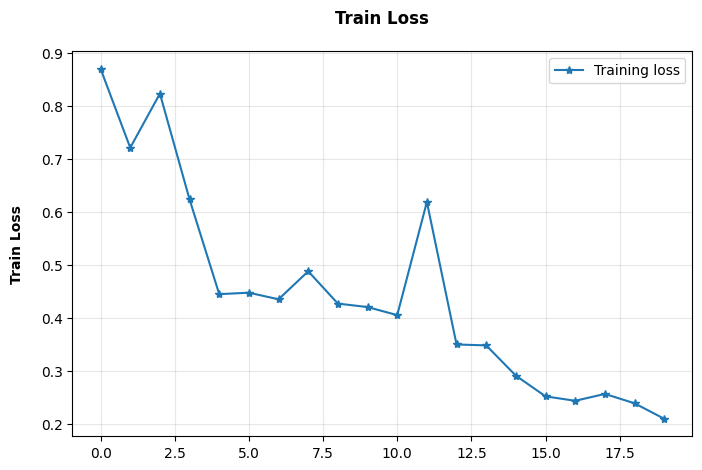

In [ ]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(8,5))

epochs = [i for i in range(20)]
ax.plot(epochs, train_loss_h, linestyle='-', marker='*', label='Training loss')
# ax.plot(epochs, val_loss_h, linestyle='-', marker='*', label='Validation loss')

ax.set_xlabel('', labelpad=12, fontweight='bold')
ax.set_ylabel('Train Loss', labelpad=12, rotation=90, fontweight='bold')

ax.set_title('Train Loss', pad=20, fontweight='bold')

ax.legend()
plt.grid(alpha=0.3)
plt.show()

In [ ]:
if os.path.isdir('maskrcnn_weights')==False: os.mkdir('maskrcnn_weights')

In [ ]:
torch.save(model, 'maskrcnn_weights/mask-rcnn-DiscoBall2.pt')

In [ ]:
torch.save(model.state_dict(), 'maskrcnn_weights/mask-rcnn-DiscoBall-weights2.pt')

In [ ]:
model.load_state_dict(torch.load(os.getcwd()+'/maskrcnn_weights/mask-rcnn-DiscoBall-weights2.pt'))

<All keys matched successfully>

In [ ]:
# set to evaluation mode
model.eval()
CLASS_NAMES = ['__background__', 'DiscoBall']
model.to(device)

MaskRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(in

In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt
import torchvision.transforms as T
import cv2
import random
import warnings
warnings.filterwarnings('ignore')

def get_coloured_mask(mask):
    """
    random_colour_masks
      parameters:
        - image - predicted masks
      method:
        - the masks of each predicted object is given random colour for visualization
    """
    colours = [[0, 255, 0],[0, 0, 255],[255, 0, 0],[0, 255, 255],[255, 255, 0],[255, 0, 255],[80, 70, 180],[250, 80, 190],[245, 145, 50],[70, 150, 250],[50, 190, 190]]
    r = np.zeros_like(mask).astype(np.uint8)
    g = np.zeros_like(mask).astype(np.uint8)
    b = np.zeros_like(mask).astype(np.uint8)
    r[mask == 1], g[mask == 1], b[mask == 1] = colours[random.randrange(0,10)]
    coloured_mask = np.stack([r, g, b], axis=2)
    return coloured_mask

def get_prediction(img_path, confidence):
    """
    get_prediction
      parameters:
        - img_path - path of the input image
        - confidence - threshold to keep the prediction or not
      method:
        - Image is obtained from the image path
        - the image is converted to image tensor using PyTorch's Transforms
        - image is passed through the model to get the predictions
        - masks, classes and bounding boxes are obtained from the model and soft masks are made binary(0 or 1) on masks
          ie: eg. segment of cat is made 1 and rest of the image is made 0

    """
    img = Image.open(img_path)
    transform = T.Compose([T.ToTensor()])
    img = transform(img)

    img = img.to(device)
    pred = model([img])
    pred_score = list(pred[0]['scores'].detach().cpu().numpy())
    pred_t = [pred_score.index(x) for x in pred_score if x>confidence][-1]
    masks = (pred[0]['masks']>0.5).squeeze().detach().cpu().numpy()
    # print(pred[0]['labels'].numpy().max())
    pred_class = [CLASS_NAMES[i] for i in list(pred[0]['labels'].cpu().numpy())]
    pred_boxes = [[(i[0], i[1]), (i[2], i[3])] for i in list(pred[0]['boxes'].detach().cpu().numpy())]
    masks = masks[:pred_t+1]
    pred_boxes = pred_boxes[:pred_t+1]
    pred_class = pred_class[:pred_t+1]
    return masks, pred_boxes, pred_class

def segment_instance(img_path, confidence=0.5, rect_th=2, text_size=1, text_th=2):
    """
    segment_instance
      parameters:
        - img_path - path to input image
        - confidence- confidence to keep the prediction or not
        - rect_th - rect thickness
        - text_size
        - text_th - text thickness
      method:
        - prediction is obtained by get_prediction
        - each mask is given random color
        - each mask is added to the image in the ration 1:0.8 with opencv
        - final output is displayed
    """
    masks, boxes, pred_cls = get_prediction(img_path, confidence)
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    for i in range(len(masks)):
      rgb_mask = get_coloured_mask(masks[i])
      img = cv2.addWeighted(img, 1, rgb_mask, 0.5, 0)

      #cv2.rectangle and cv2.putText version dependent
      pt1 = tuple([int(j) for j in boxes[i][0]])
      pt2 = tuple([int(j) for j in boxes[i][1]])
      cv2.rectangle(img, pt1, pt2,color=(0, 255, 0), thickness=rect_th)
      cv2.putText(img,pred_cls[i], pt1, cv2.FONT_HERSHEY_SIMPLEX, text_size, (0,255,0),thickness=text_th)
    plt.figure(figsize=(20,30))
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])
    plt.show()

2023-05-19 20:22:57 URL:https://images.unsplash.com/photo-1546081614-6f95a437dc2c?ixlib=rb-4.0.3&q=85&fm=jpg&crop=entropy&cs=srgb&dl=stavrialena-gontzou-xynVB41RzXA-unsplash.jpg [1267470/1267470] -> "disc.jpg" [1]


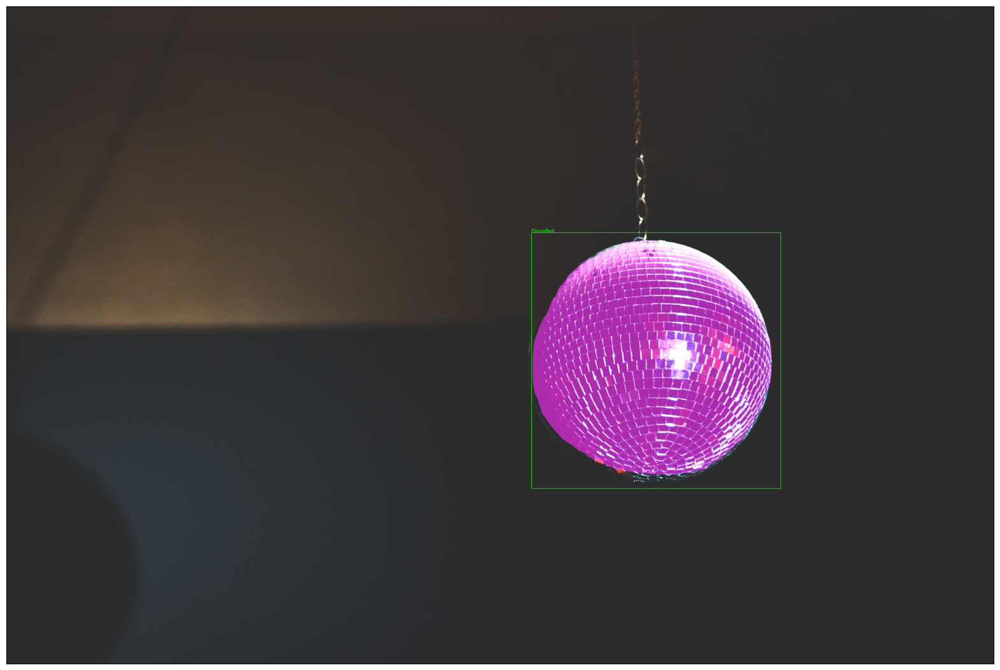

In [ ]:
!wget -nv "https://images.unsplash.com/photo-1546081614-6f95a437dc2c?ixlib=rb-4.0.3&q=85&fm=jpg&crop=entropy&cs=srgb&dl=stavrialena-gontzou-xynVB41RzXA-unsplash.jpg" --no-check-certificate -O disc.jpg
segment_instance('./disc.jpg', confidence=0.7)

2023-05-19 20:23:46 URL:https://images.unsplash.com/photo-1615743893538-c502749d04a0?ixlib=rb-4.0.3&q=85&fm=jpg&crop=entropy&cs=srgb&dl=sergi-dolcet-escrig-mzPLuN-gD3U-unsplash.jpg [2510068/2510068] -> "disc3.jpg" [1]


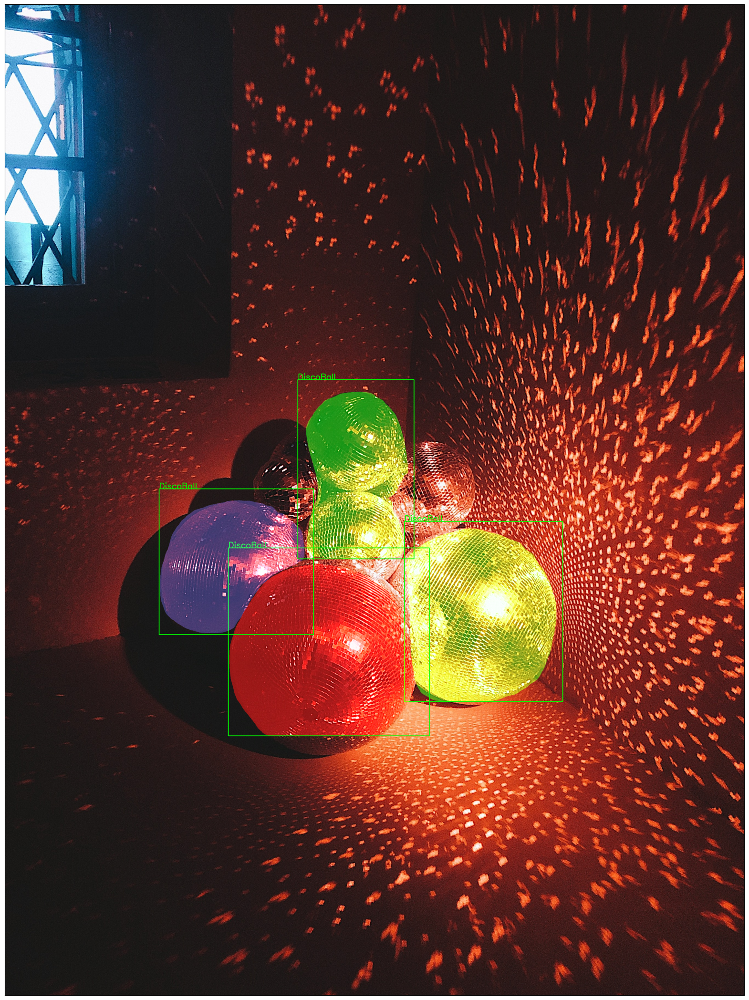

In [ ]:
!wget -nv "https://images.unsplash.com/photo-1615743893538-c502749d04a0?ixlib=rb-4.0.3&q=85&fm=jpg&crop=entropy&cs=srgb&dl=sergi-dolcet-escrig-mzPLuN-gD3U-unsplash.jpg" --no-check-certificate -O disc3.jpg
segment_instance('./disc3.jpg', confidence=0.7)